In [1]:
import os
import sys

# to setup import paths add project root dirs to sys.path
sys.path.append(os.path.join(os.getcwd(), "..", ".."))
from baseVR.base_functionality import init_import_paths
init_import_paths()


In [2]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# %matplotlib qt
# %matplotlib widget

from analytics_processing import analytics
import analytics_processing.analytics_constants as C
from CustomLogger import CustomLogger as Logger

from dashsrc.plot_components.plot_wrappers.data_selection import group_filter_data

from analytics_processing.modality_loading import session_modality_from_nas
from analytics_processing.sessions_from_nas_parsing import sessionlist_fullfnames_from_args
from analytics_processing.sessions_from_nas_parsing import fullfnames2snames


In [3]:
%matplotlib widget

In [4]:
output_dir = "/mnt/SpatialSequenceLearning/Simon/hmm_actions"
data = {}
nas_dir = C.device_paths()[0]
Logger().init_logger(None, None, logging_level="INFO")


In [5]:
animal_ids = [6]
paradigm_ids = [1100]
session_ids = None

In [6]:
session_dirs = sessionlist_fullfnames_from_args(paradigm_ids, animal_ids, session_ids)[0]
session_names = fullfnames2snames(session_dirs)

In [7]:
framew_beh = analytics.get_analytics('BehaviorFramewise', session_names=session_names)#[:34],)
# framew_beh = analytics.get_analytics('BehaviorFramewise', session_names=session_names,)
# framew_beh[['frame_raw_abs_acc_500msMedian']]
framew_beh

/home/vrmaster/Projects/VirtualReality/analysisVR/analytics_processing/analytics.py:599: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  aggr = pd.concat(aggr)
2026-02-18 07:50:20,588|INFO|1334787|analytics|get_analytics
	Returning BehaviorFramewise for 34 sessions.


frame_id  frame_pc_timestamp  \
paradigm_id animal_id session_id       entry_id                                 
1100        6         2024-11-14_15-01 0            14109    1731592882746345   
                                       1            14110    1731592882763007   
                                       2            14111    1731592882779674   
                                       3            14112    1731592882797859   
                                       4            14113    1731592882814538   
...                                                   ...                 ...   
                      2025-01-27_13-39 265636      287569    1737986032936566   
                                       265637      287570    1737986032953237   
                                       265638      287571    1737986032969901   
                                       265639      287572    1737986032986570   
                                       265640      287573    1737986033003237   

                                                 frame_position  \
paradigm_id animal_id session_id       entry_id                   
1100        6         2024-11-14_15-01 0                    NaN   
                                       1                    NaN   
                                       2                    NaN   
                                       3                    NaN   
                                       4                    NaN   
...                                                         ...   
                      2025-01-27_13-39 265636         -166.7919   
                                       265637         -166.7178   
                                       265638         -166.6485   
                                       265639         -166.5945   
                                       265640         -166.5251   

                                                 frame_ephys_timestamp  \
paradigm_id animal_id session_id       entry_id                          
1100        6         2024-11-14_15-01 0                           NaN   
                                       1                           NaN   
                                       2                           NaN   
                                       3                           NaN   
                                       4                           NaN   
...                                                                ...   
                      2025-01-27_13-39 265636             4.435022e+09   
                                       265637             4.435039e+09   
                                       265638             4.435056e+09   
                                       265639             4.435072e+09   
                                       265640             4.435089e+09   

                                                 trial_id frame_ephys_patched  \
paradigm_id animal_id session_id       entry_id                                 
1100        6         2024-11-14_15-01 0              NaN                None   
                                       1              NaN                None   
                                       2              NaN                None   
                                       3              NaN                None   
                                       4              NaN                None   
...                                                   ...                 ...   
                      2025-01-27_13-39 265636       152.0                   0   
                                       265637       152.0                   0   
                                       265638       152.0                   0   
                                       265639       152.0                   0   
                                       265640       152.0                   0   

                                                       fps track_zone  \
paradigm_id animal_id session_id 

In [8]:
# s_id = '2024-12-11_17-42' #17
# trial_id = 34
# # time_col = 'frame_pc_timestamp'
# time_col = 'frame_ephys_timestamp'

# session_data = framew_beh.xs(s_id, level='session_id')
# trial_data = session_data.loc[session_data['trial_id'] == trial_id]

# trial_data = trial_data.set_index(time_col, drop=True, append=False)
# trial_data.index = (trial_data.index - trial_data.index[0]) /1e6
# trial_data

In [9]:
framew_beh.columns.tolist()

['frame_id',
 'frame_pc_timestamp',
 'frame_position',
 'frame_ephys_timestamp',
 'trial_id',
 'frame_ephys_patched',
 'fps',
 'track_zone',
 'track_zone_int',
 'from_cm_position_bin',
 'to_cm_position_bin',
 'frame_velocity',
 'frame_acc',
 'frame_raw',
 'frame_yaw',
 'frame_pitch',
 'frame_raw_500msMedian',
 'frame_yaw_500msMedian',
 'frame_pitch_500msMedian',
 'frame_raw_abs_acc_500msMedian',
 'frame_yaw_abs_acc_500msMedian',
 'frame_pitch_abs_acc_500msMedian',
 'frame_RawYawPitch_abs_vel_sum',
 'frame_RawYawPitch_abs_vel_sum_500msMedian',
 'frame_RawYawPitch_abs_acc_sum_500msMedian',
 'frame_YawPitch_abs_vel_sum_500msMedian',
 'frame_YawPitch_abs_acc_sum_500msMedian',
 'forward_vs_rotation_corr',
 'frame_forward_prop',
 'frame_below_velocity_thr',
 'lick_count',
 'lick_mean_value',
 'reward-removed_count',
 'reward-removed_mean_value',
 'reward-sound_count',
 'reward-sound_mean_value',
 'reward-valve-open_count',
 'reward-valve-open_mean_value',
 'lick_detected',
 'reward-removed_d

In [37]:
action_cols = [
               # forward velocity and acc
               'frame_raw', 
               'frame_raw_500msMedian', 
               'frame_yaw', 
               'frame_pitch', 
            #    'frame_raw_abs_acc_500msMedian', 
               # off rotations velocity
               'frame_YawPitch_abs_vel_sum_500msMedian', 
            #    'frame_YawPitch_abs_acc_sum_500msMedian', 
               # sum for reward threshold and acc
               'frame_RawYawPitch_abs_vel_sum',
               # 'frame_RawYawPitch_abs_vel_sum',
               # 'frame_RawYawPitch_abs_acc_sum_500msMedian',
               # others
            #    'lick_detected', 
               'trial_id', 
               'trial_outcome', 
               'choice_R1', 
               
               # derived metrics
               'frame_forward_prop',
               'velocity_threshold_at_R1',
               'forward_vs_rotation_corr',
               
               'frame_below_velocity_thr'
               ]

renamer = {
      'frame_raw_500msMedian': 'ball_forward_vel',
      'frame_raw_abs_acc_500msMedian': 'ball_forward_acc',
      'frame_YawPitch_abs_vel_sum_500msMedian': 'ball_rotation_vel',
      'frame_YawPitch_abs_acc_sum_500msMedian': 'ball_rotation_acc',
      'frame_RawYawPitch_abs_vel_sum': 'ball_forward+rotation_vel',
      # 'frame_RawYawPitch_abs_vel_sum_500msMedian': 'ball_forward+rotation_vel',
      'frame_RawYawPitch_abs_acc_sum_500msMedian': 'ball_forward+rotation_acc',
      'lick_detected': 'licking',
      'frame_forward_prop': 'forward_proportion',
      'forward_vs_rotation_corr': 'forward_vs_rotation_corr',
      'frame_below_velocity_thr': 'below_r_thr',
}
framew_beh['frame_below_velocity_thr'] = framew_beh['frame_below_velocity_thr'].fillna(0)
actions = framew_beh[action_cols].dropna() # # just for NaN dropping (first ~80 frames of a session)
actions = actions.rename(columns=renamer)

actions

frame_raw  ball_forward_vel  \
paradigm_id animal_id session_id       entry_id                                
1100        6         2024-11-14_15-01 88        14.899892         21.552511   
                                       89        20.620413         21.552511   
                                       90        24.251396         22.435904   
                                       91        27.930426         24.799924   
                                       92        30.082838         25.488759   
...                                                    ...               ...   
                      2025-01-27_13-39 265636     5.276067          5.321221   
                                       265637     4.439806          5.366375   
                                       265638     4.164066          5.688945   
                                       265639     3.237747          6.011516   
                                       265640     4.163317          6.013681   

                                                 frame_yaw  frame_pitch  \
paradigm_id animal_id session_id       entry_id                           
1100        6         2024-11-14_15-01 88         1.141520    -3.193374   
                                       89         1.596786    -3.899736   
                                       90         0.837265    -3.903716   
                                       91         0.152102    -3.191267   
                                       92         0.304460    -3.903716   
...                                                    ...          ...   
                      2025-01-27_13-39 265636     5.936971     0.000000   
                                       265637     6.617240     0.000000   
                                       265638     7.685310     0.000000   
                                       265639     7.302658     0.000000   
                                       265640     9.053339     0.000000   

                                                 ball_rotation_vel  \
paradigm_id animal_id session_id       entry_id                      
1100        6         2024-11-14_15-01 88                 7.171263   
                                       89                 7.209227   
                                       90                 7.247351   
                                       91                 7.285616   
                                       92                 7.475126   
...                                                            ...   
                      2025-01-27_13-39 265636             3.753560   
                                       265637             3.904989   
                                       265638             4.133249   
                                       265639             4.361510   
                                       265640             4.545842   

                                                 ball_forward+rotation_vel  \
paradigm_id animal_id session_id       entry_id                              
1100        6         2024-11-14_15-01 88                        19.234786   
                                       89                        26.116935   
                                       90                        28.992376   
                                       91                        31.273796   
                                       92                        34.291014   
...                                                                    ...   
                      2025-01-27_13-39 265636                    11.213038   
                                       265637                    11.057045   
                                       265638                    11.849376   
                                       265639                    10.540404   
                                       265640                    13.216656   

                                                 trial_id  trial_outcome  \
paradigm_id animal_id session_

In [49]:
actions_cp = actions.copy()
actions_cp['track_zone'] = framew_beh.loc[actions.index, 'track_zone']
actions_cp['trial_id'] = framew_beh.loc[actions.index, 'trial_id']
actions_cp.reset_index(inplace=True)
actions_cp

nframes_pre, nframes_post = 65, 125
def around_r1_entries(group):
    r1_idx = group[group['track_zone'] == 'reward1Zone'].index[0]
    return np.arange(r1_idx - nframes_pre, r1_idx + nframes_post)
    # r1_idx = group[group['track_zone'] == 'reward1Zone'].index
    # return np.arange(r1_idx[0]-60, r1_idx[-1]+30)

r1_entries = actions_cp.groupby(by=['session_id', 'trial_id']).apply(around_r1_entries, )

r1_entries = np.concatenate(r1_entries.values)
print(r1_entries.shape)
# print(frame_id_from_start.shape)
print(f"Slicing to {nframes_pre} frames before and {nframes_post} frames after R1 entry gives us {len(r1_entries)}/{len(actions_cp)} frames to analyze around R1 entries.")

actions = actions.iloc[r1_entries]
actions['frame_id_from_start'] = actions.groupby(by=['session_id', 'trial_id']).cumcount()

AssertionError: Length of new_levels (4) must be <= self.nlevels (3)

In [ ]:
actions = actions.set_index(['trial_id', 'frame_id_from_start'], append=True).reset_index(level=[0,1,3])
actions

paradigm_id  animal_id  \
session_id       trial_id frame_id_from_start                           
2024-11-14_15-01 1.0      0                           1100          6   
                          1                           1100          6   
                          2                           1100          6   
                          3                           1100          6   
                          4                           1100          6   
...                                                    ...        ...   
2025-01-27_13-39 152.0    175                         1100          6   
                          176                         1100          6   
                          177                         1100          6   
                          178                         1100          6   
                          179                         1100          6   

                                               entry_id  frame_raw  \
session_id       trial_id frame_id_from_start                        
2024-11-14_15-01 1.0      0                         379  45.518930   
                          1                         380  45.328454   
                          2                         381  46.172097   
                          3                         382  47.091738   
                          4                         383  48.924489   
...                                                 ...        ...   
2025-01-27_13-39 152.0    175                    263451  48.971483   
                          176                    263452  47.834753   
                          177                    263453  46.979489   
                          178                    263454  43.005458   
                          179                    263455  44.998919   

                                               ball_forward_vel  frame_yaw  \
session_id       trial_id frame_id_from_start                                
2024-11-14_15-01 1.0      0                           44.776065  -0.989020   
                          1                           44.969131  -0.456416   
                          2                           44.969131  -0.836964   
                          3                           44.969131  -1.217256   
                          4                           44.969131  -0.836562   
...                                                         ...        ...   
2025-01-27_13-39 152.0    175                         50.604227   9.743891   
                          176                         49.329846  10.879875   
                          177                         48.709510  11.406981   
                          178                         48.152631  11.559767   
                          179                         47.846240  12.943437   

                                               frame_pitch  ball_rotation_vel  \
session_id       trial_id frame_id_from_start                                   
2024-11-14_15-01 1.0      0                     -13.745125          11.947085   
                          1                     -15.073490          12.213135   
                          2                     -15.520552          12.478061   
                          3                     -15.784724          12.697126   
                          4                     -17.108739          12.787315   
...                                                    ...                ...   
2025-01-27_13-39 152.0    175                   -15.439275          23.106563   
                          176                   -17.204608          22.858396   
                          177                   -18.525969          23.009275   
                          178                   -17.463324          23.124997   
                          179                   -17.571995          23.427564   

                                               ball_forward+rotation_vel  \
session_id       trial_id frame_id_from_s

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


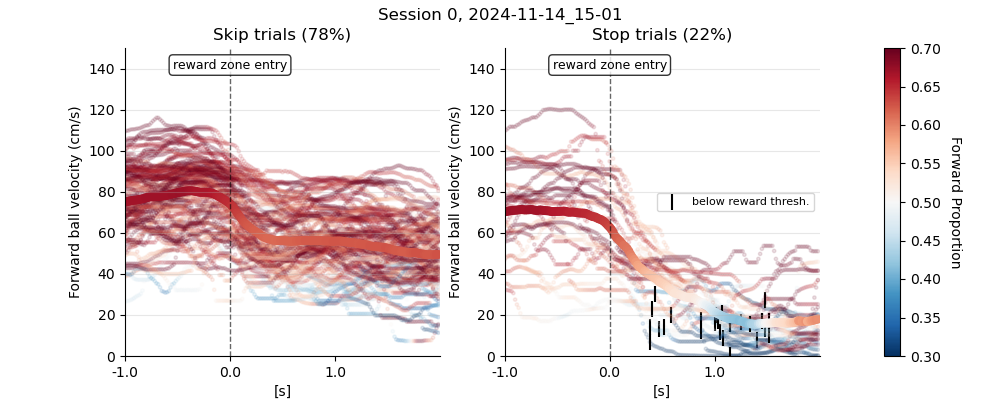

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


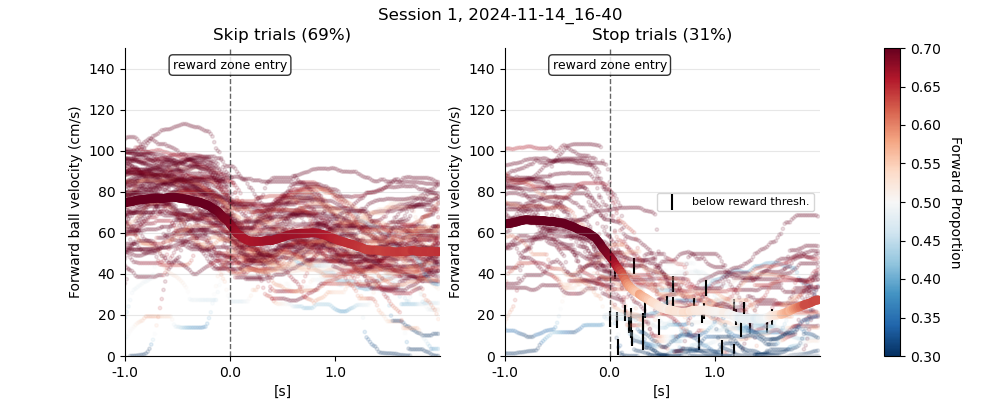

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


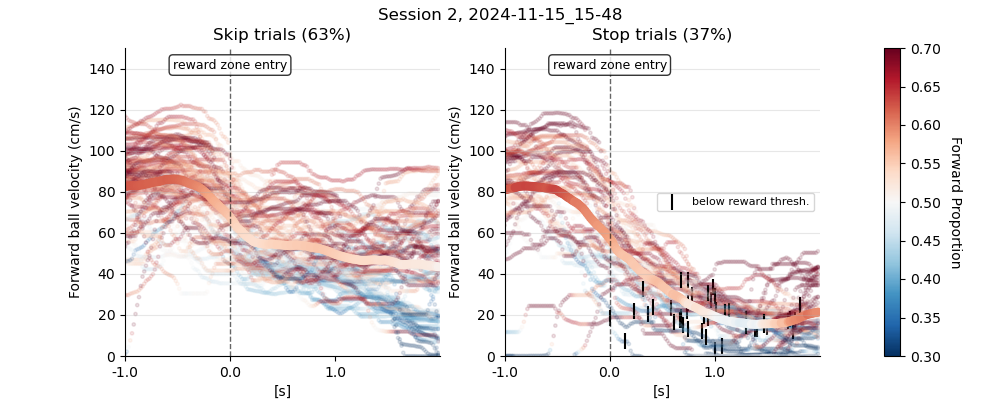

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


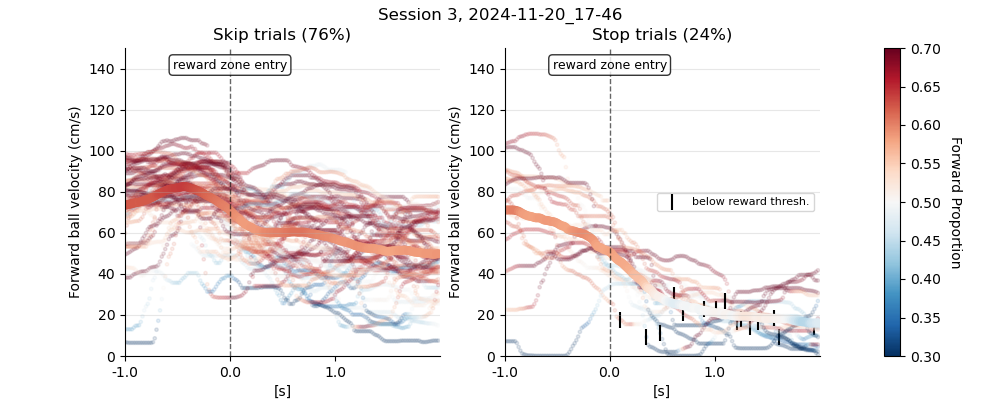

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


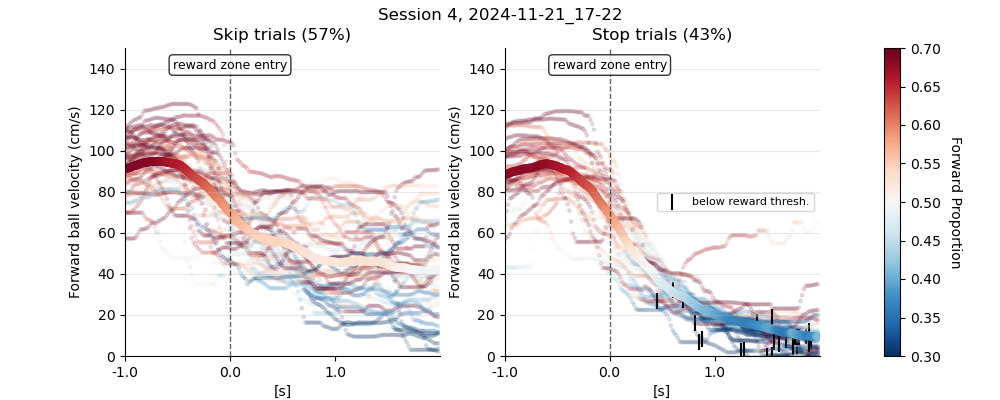

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


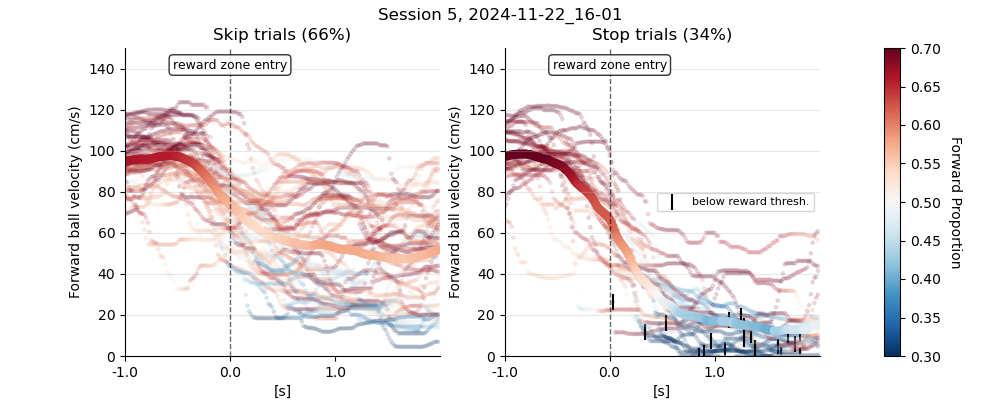

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


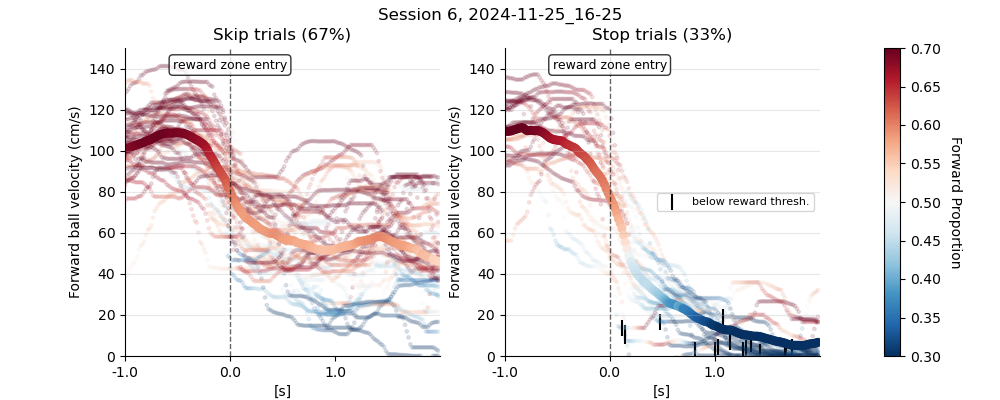

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


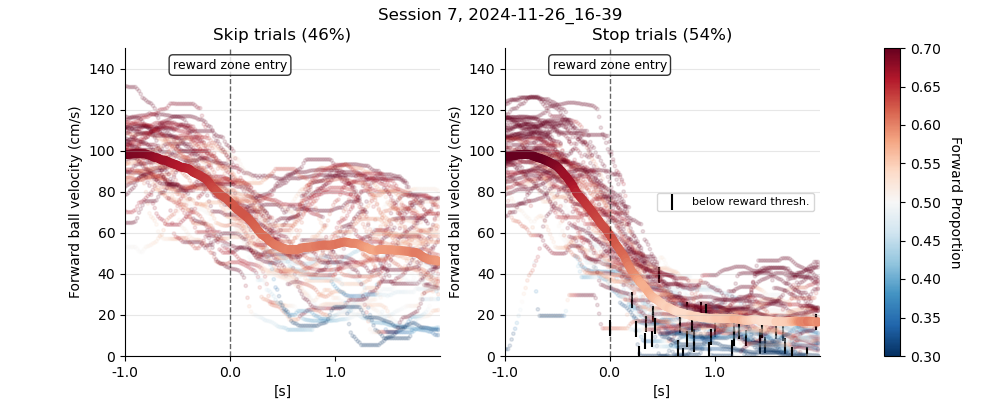

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


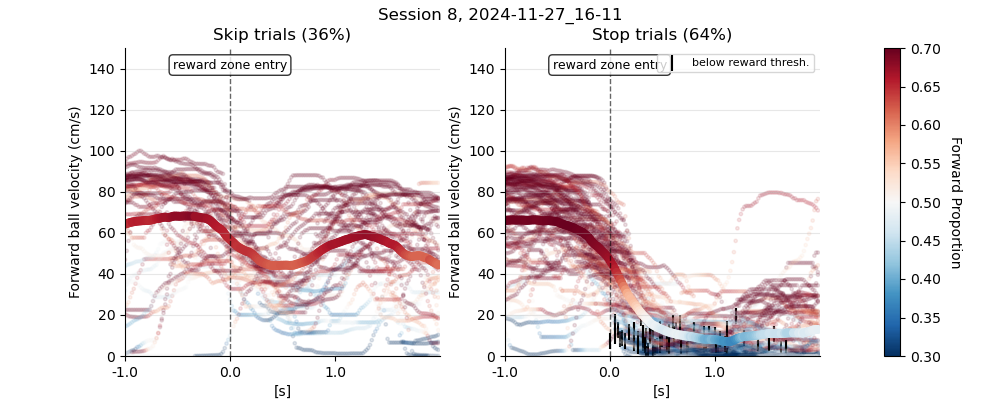

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


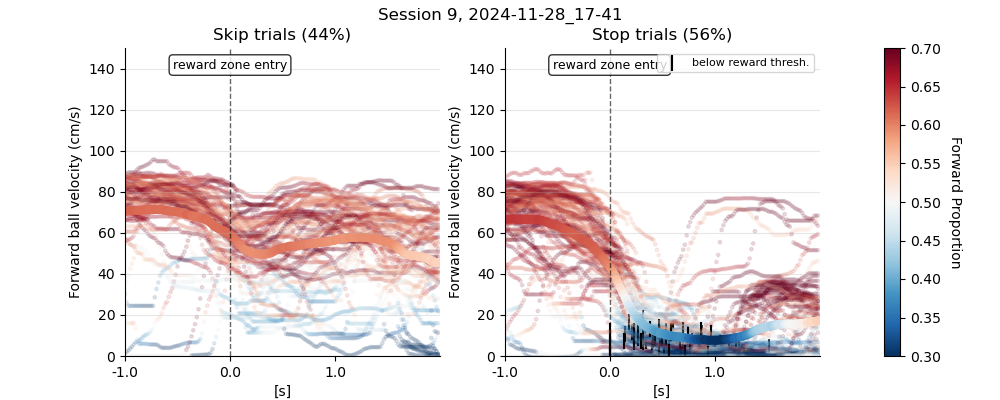

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


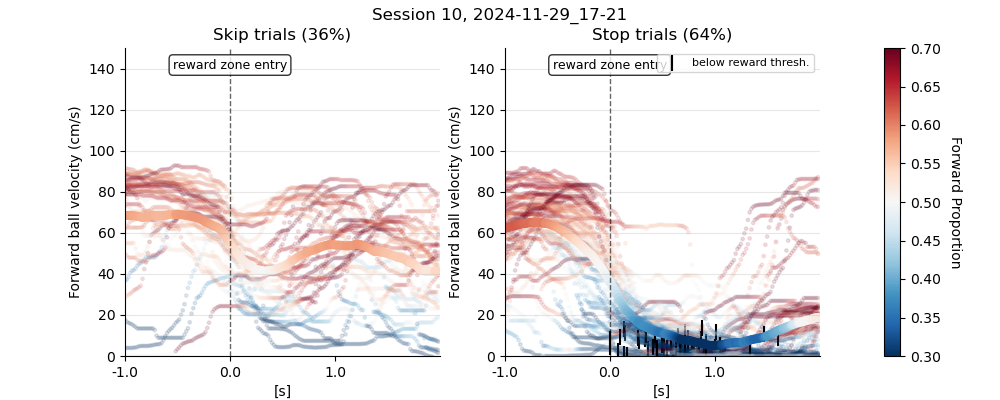

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


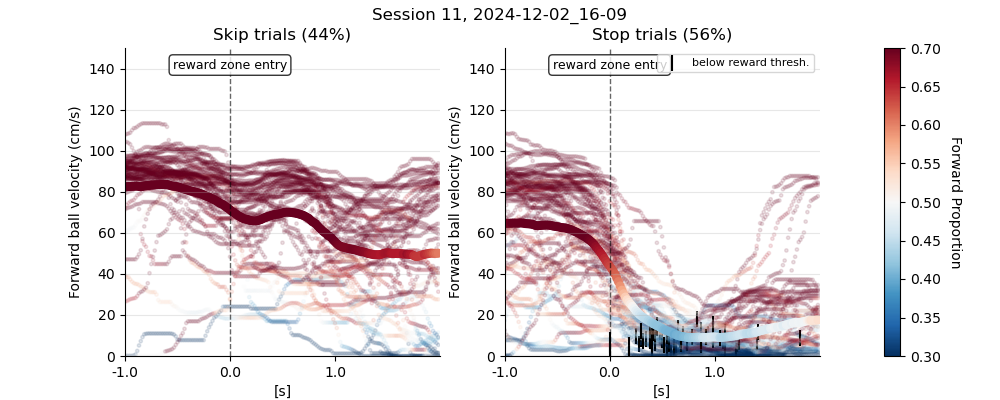

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


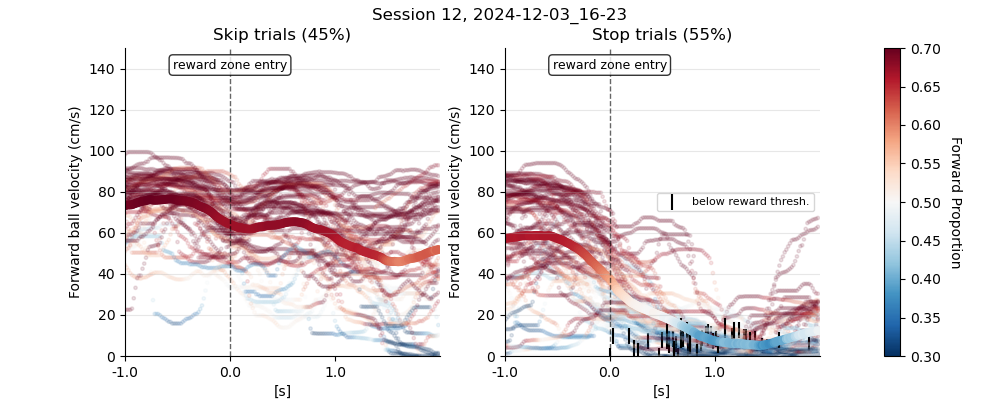

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


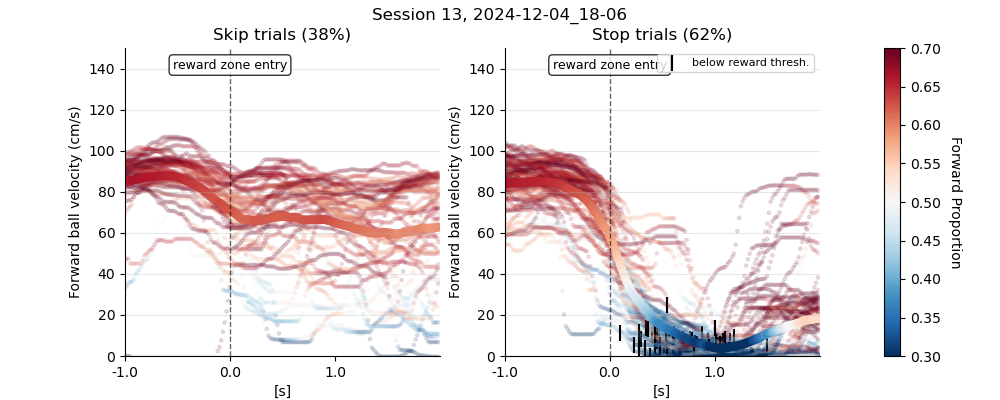

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


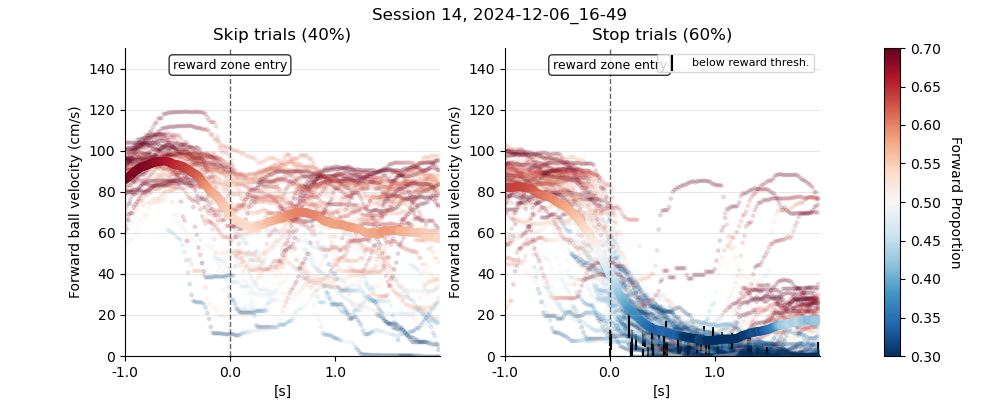

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


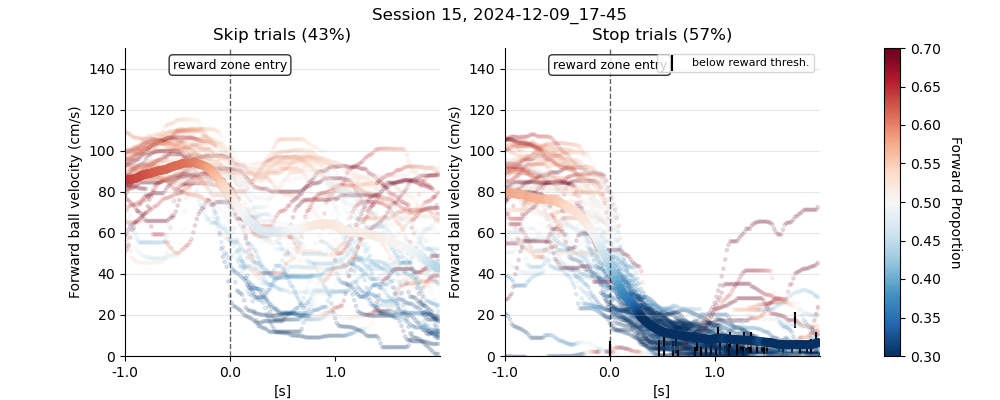

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


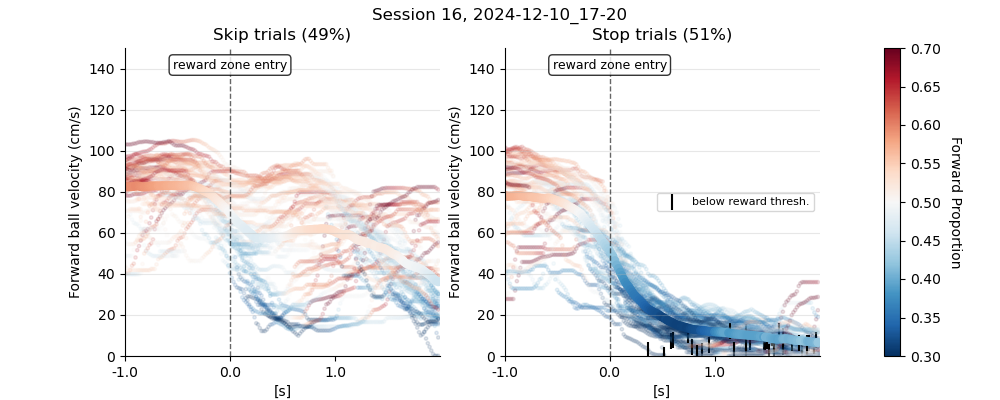

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


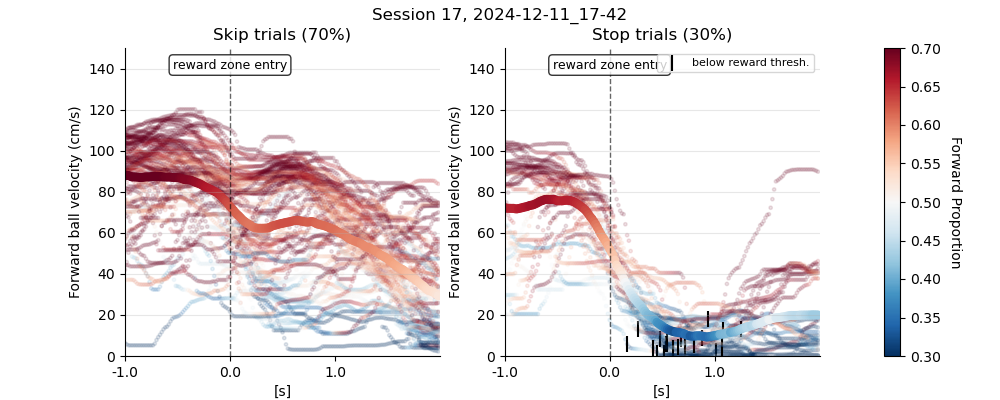

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


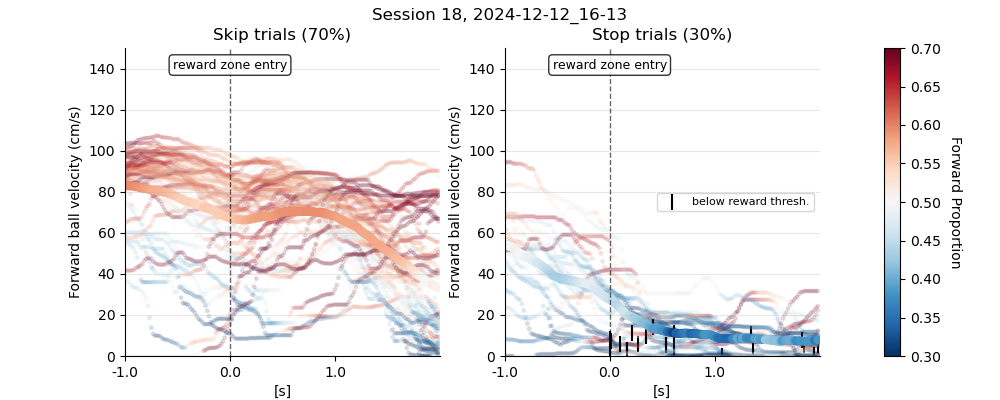

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


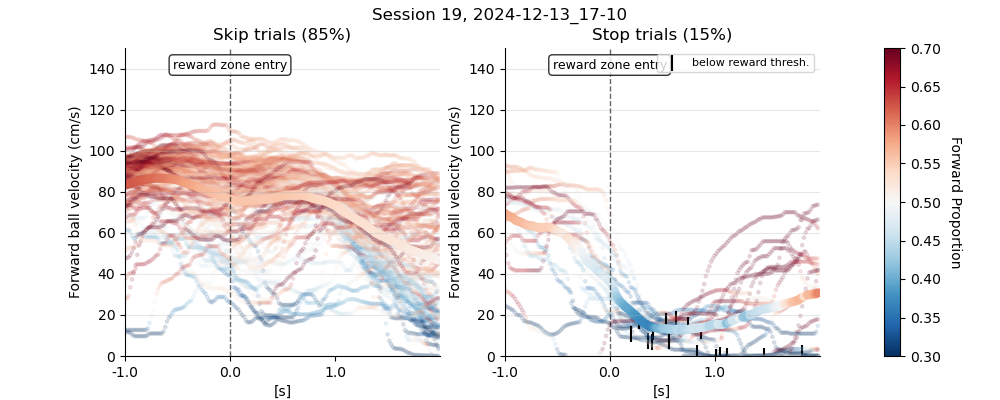

/tmp/ipykernel_1334787/410453791.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10, 4))
/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


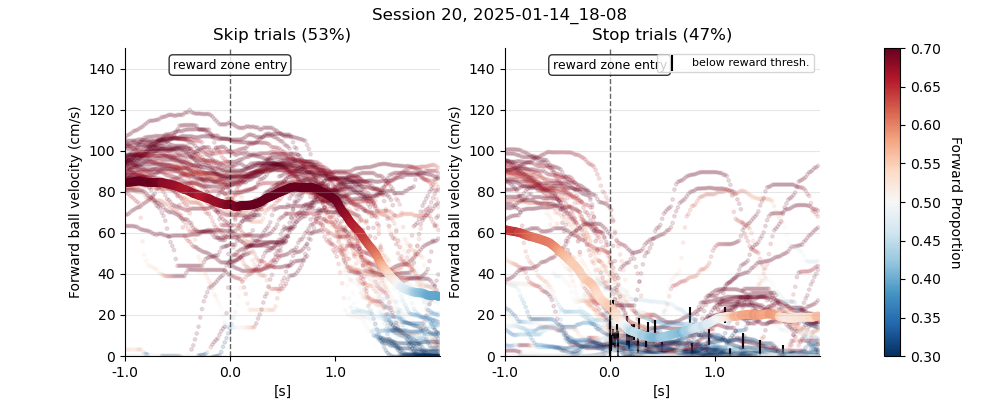

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


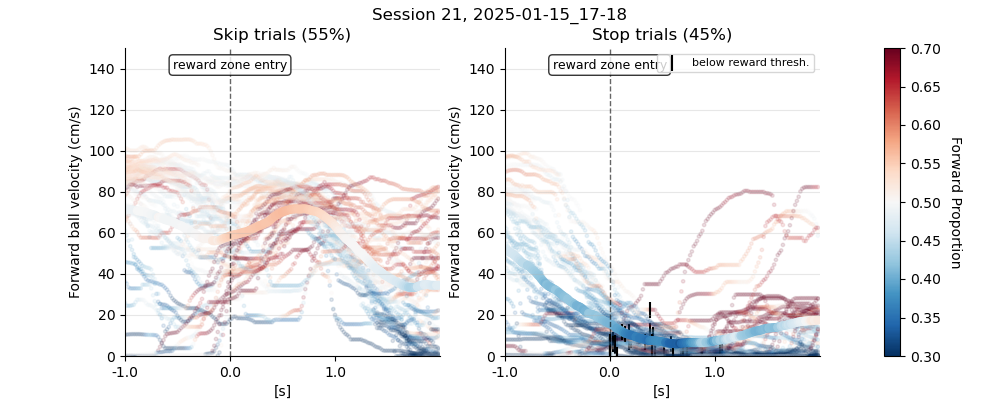

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


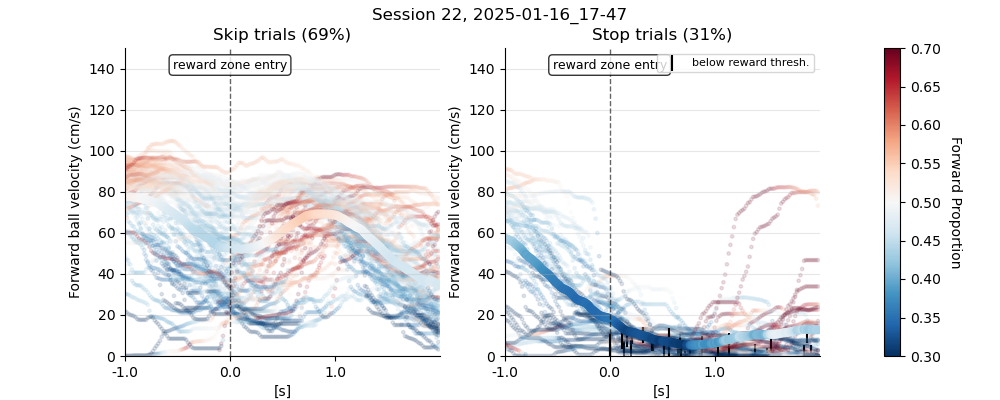

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


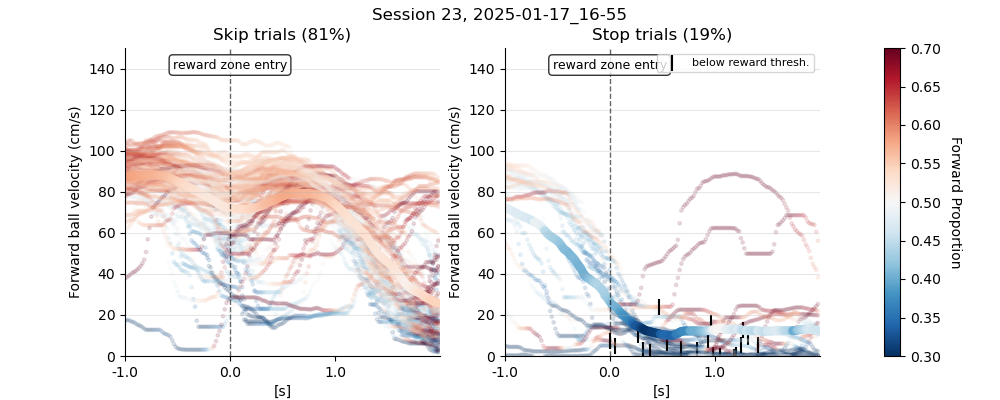

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


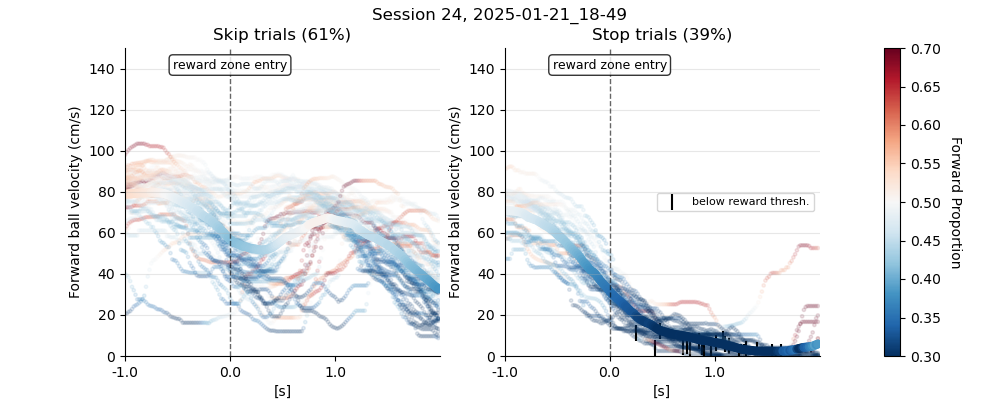

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


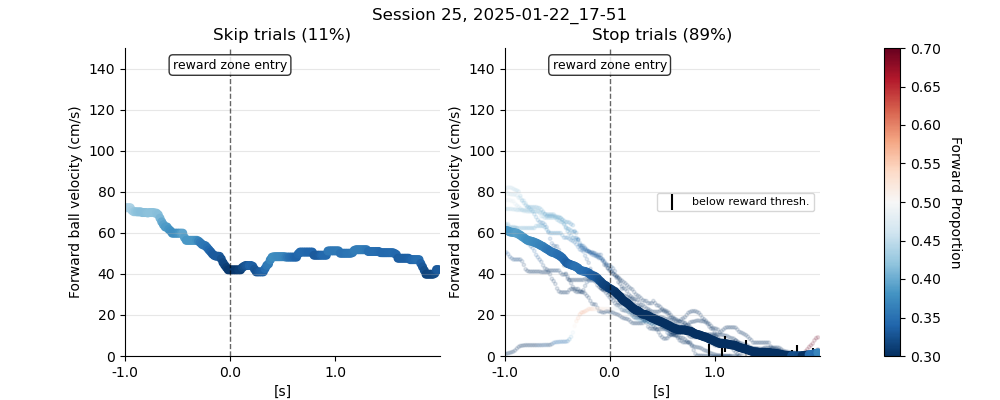

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


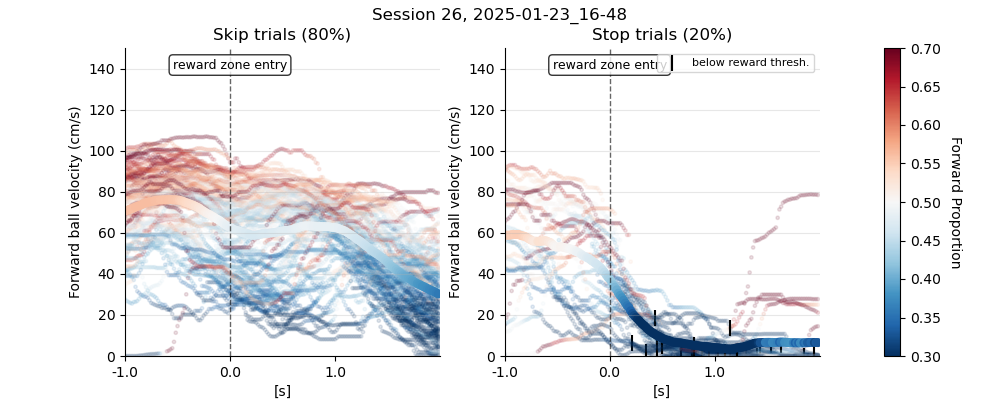

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


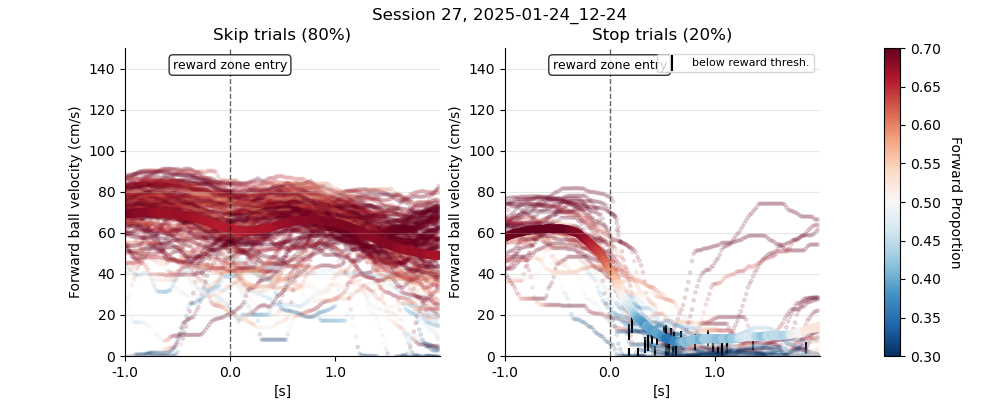

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


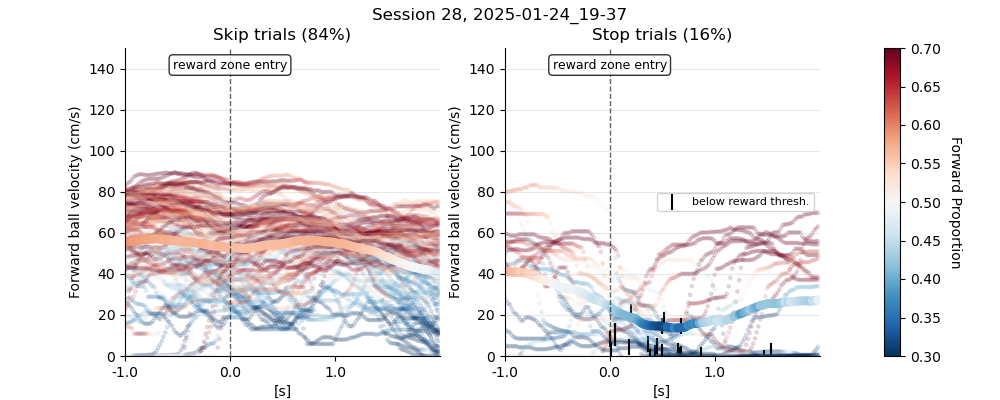

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


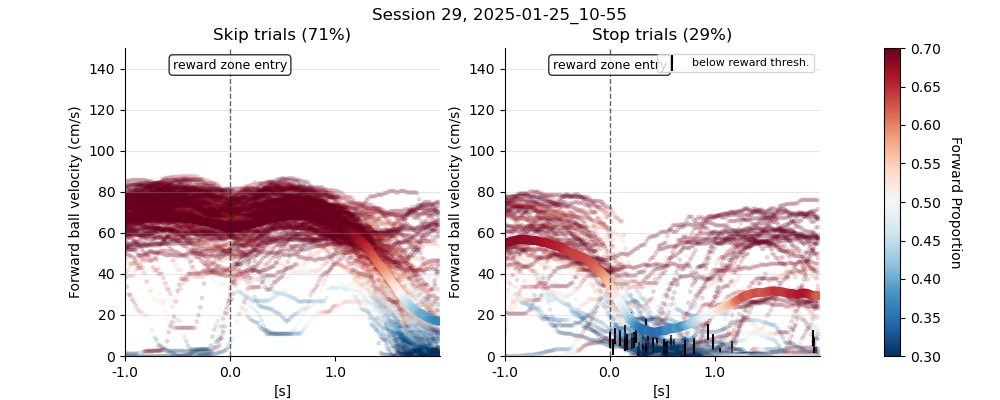

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


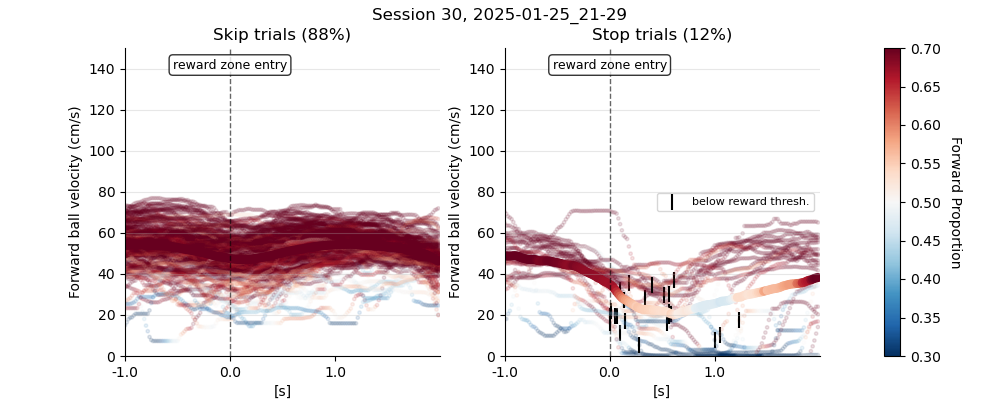

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


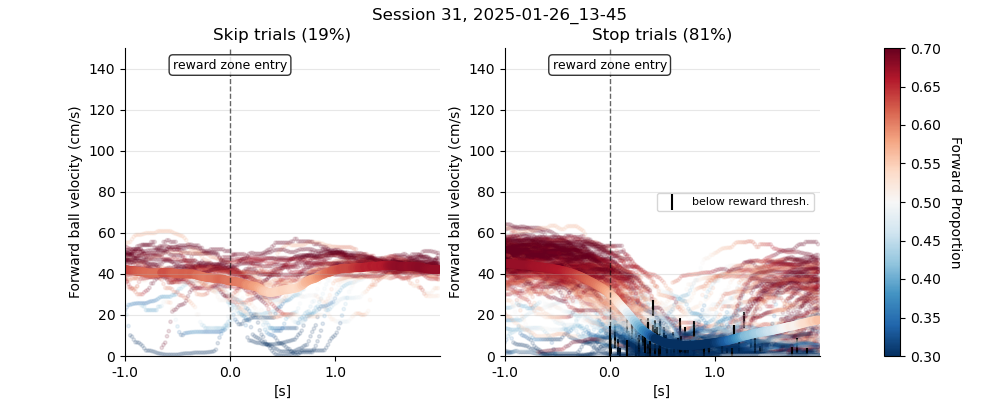

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


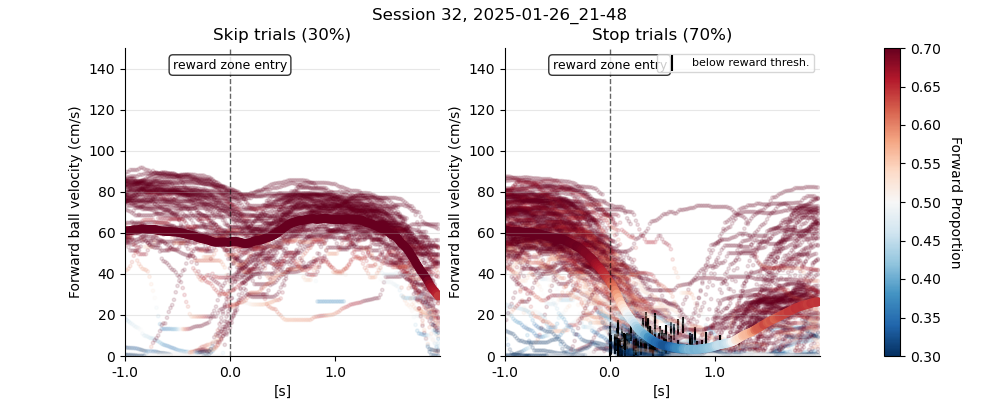

/tmp/ipykernel_1334787/410453791.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


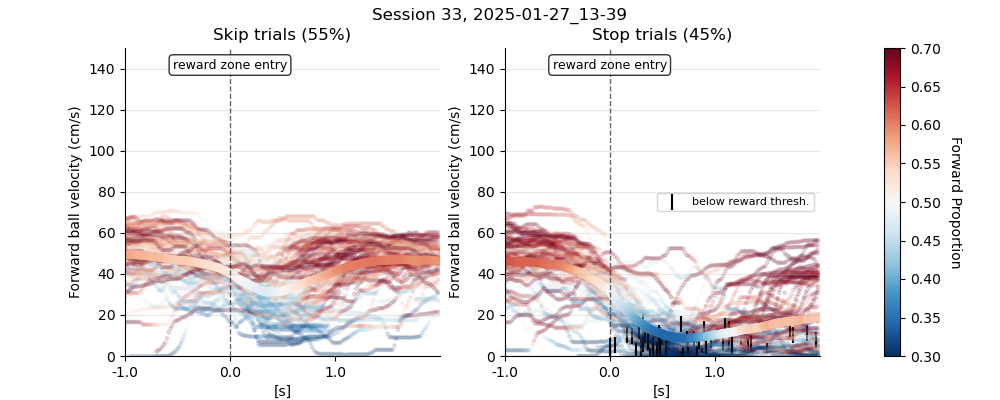

In [60]:
plt.close("all")
def plot_session_vel_props(session_data):
    fig = plt.figure(figsize=(10, 4))
    gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.05], wspace=0.3)
    ax = [fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[0, 1])]
    cax = fig.add_subplot(gs[0, 2])
    
    n_choices = 0
    n = len(session_data.index.unique("trial_id"))
    
    stop_choices, stop_choice_c = [], []
    skip_choices, skip_choice_c = [], []
    
    sample_of_trials = session_data.index.unique("trial_id")
    
    labeled = False
    for trial_id in sample_of_trials:
        trial_mask = session_data.index.get_level_values('trial_id') == trial_id
        trial_data = session_data[trial_mask]
        trial_data = trial_data.reset_index(drop=True)
        
        ax_i = 1 if (trial_data.iloc[0]['choice_R1'] %5) >0 else 0
        
        x = np.arange(trial_data.shape[0])
        col = trial_data['forward_proportion'].values
        
        if ax_i:
            n_choices += ax_i
            stop_choices.append(trial_data['ball_forward_vel'].values)
            stop_choice_c.append(col)
        else:
            skip_choices.append(trial_data['ball_forward_vel'].values)
            skip_choice_c.append(col)
        
        sc = ax[ax_i].scatter(x, trial_data['ball_forward_vel'].values, c=col, alpha=0.12, s=6, cmap='RdBu_r', vmin=.3, vmax=.7)
        
        if ax_i == 1:
            r_time = trial_data.loc[trial_data['below_r_thr'].astype(bool), 'ball_forward_vel'].iloc[0:1]
            ax[ax_i].scatter(r_time.index, r_time.values, marker='|', s=120, color='k', label='below reward thresh.' if not labeled else None)
            labeled = True

    stop_choices = np.stack(stop_choices).mean(0)
    stop_choice_c = np.stack(stop_choice_c).mean(0)
    ax[1].scatter(np.arange(len(stop_choices)), stop_choices, c=stop_choice_c, s=30, cmap='RdBu_r', vmin=.3, vmax=.7)
    
    skip_choices = np.stack(skip_choices).mean(0)
    skip_choice_c = np.stack(skip_choice_c).mean(0)
    sc = ax[0].scatter(np.arange(len(skip_choices)), skip_choices, c=skip_choice_c, s=30, cmap='RdBu_r', vmin=.3, vmax=.7)
    
    # Set xticks to reflect time from t=0 (frame 60 = t=0)
    xtick_frames = np.array([0,60,120])
    xtick_times = xtick_frames-60
    
    for i, axis in enumerate(ax):
        axis.set_xlim(0, 180)
        axis.set_ylim(0, 150)
        axis.grid(True, axis='y', alpha=0.3)
        axis.set_xticks(xtick_frames)
        axis.set_xticklabels([f'{t/60:.1f}' for t in xtick_times])
        axis.set_ylabel('Forward ball velocity (cm/s)')
        axis.axvline(60, color='k', linestyle='--', linewidth=1, alpha=0.6)
        axis.text(60, 140, 'reward zone entry', fontsize=9, ha='center', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        # Remove spines
        axis.spines['top'].set_visible(False)
        axis.spines['right'].set_visible(False)
    
    ax[0].set_title(f"Skip trials ({(n-n_choices)/n*100:.0f}%)")
    ax[0].set_xlabel("[s]")
    ax[1].set_xlabel("[s]")
    ax[1].set_title(f"Stop trials ({n_choices/n*100:.0f}%)")
    ax[1].legend(loc='best', fontsize=8)
    
    # Add colorbar on the dedicated axis
    cbar = plt.colorbar(sc, cax=cax)
    cbar.set_label('Forward Proportion', rotation=270, labelpad=15)
    
    # Add shared x-axis label
    # fig.text(0.5, 0.02, 'Time from R1 entry (frames)', ha='center', fontsize=10)

        
for i, s_id in enumerate(actions.index.unique('session_id')):
    session_data = actions.loc[s_id]
    plot_session_vel_props(session_data)
    plt.suptitle(f"Session {i}, {s_id}", y=0.98)
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.show()
    # break